#Neural Style Transfer using VGG and ResNet50

Neural-Style transfer was first introduced by Leon A. Gatys, Alexander S. Ecker and Matthias Bethge in 2015 in their paper [Image Style Transfer Using Convolutional Neural Networks](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf).  

Neural-Style transfer allows your to transfer the style from one image, usually a work of art, to another image. Gatys et al. based their approach on the process of extracting features of different scales from different layers in the model. They were able to show that lower layers in the model capture local textures and colors, while layers farther along in the model capture more general/global structures like image content.

Gatys et al. used a pretrained VGG19 model to accomplish their neural style transfer. Here I will attempt to recreate their results with the same VGG19 model, as well as a ResNet50 pretrained model.

###Import needed libraries

In [ ]:
%%capture

!pip install ipython-autotime

In [ ]:
%load_ext autotime

import os
import requests
from io import BytesIO
import copy
from PIL import Image
from IPython.display import Image as Image2
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models

###Set device to GPU

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

time: 1.14 ms


###Get images from the internet

In [ ]:
# get images from url
r1 = requests.get('https://images.saatchiart.com/saatchi/875928/art/3983809/3053663-ECOVKVAT-7.jpg')
r2 = requests.get('https://miro.medium.com/max/1000/1*vE1unzS5gGMJXq_rUoFvSA.jpeg')

# save images to cwd
style_img = Image.open(BytesIO(r1.content))
style_img.save('colorful_bowie.jpg')

content_img = Image.open(BytesIO(r2.content))
content_img.save('cat.jpg')

time: 331 ms


###Set commonly used image variables

In [ ]:
# set commonly used variables
style_image_path = '/content/colorful_bowie.jpg'
content_image_path = '/content/cat.jpg'
content_image = Image.open(content_image_path)
content_image_resized = content_image.resize((320,320))
style_image = Image.open(style_image_path)
style_image_resized = style_image.resize((320,320))

time: 43.8 ms


Pytorch neural network models are trained with tensor value between 0-1, PIL images have pixel values between 0-255. When you transform to a tensor using 'transforms.ToTensor', the values are automatically scaled to 0-1.

###Function to transform images

In [ ]:
# will resize one side to 512, but keep the aspect ratio
image_size = 512

def transform_images(path_to_image):
  # resize image and convert to tensor
  to_tensor = transforms.Compose([transforms.Resize(image_size), transforms.ToTensor()])

  # open image and transform
  image = Image.open(path_to_image)
  image = to_tensor(image)

  # return image to GPU as type float
  return image.to(device, torch.float)

time: 3.27 ms


The images are passed through the network as 4 dimensional tensors. To visualize the images during or after the model runs, you have to reconvert to PIL image format and 'squeeze' out the batch dimension.

###Function to display image from tensor 

In [ ]:
def display_image(tensor, title=None):
  # convert to image
  to_PIL = transforms.ToPILImage()  
  
  # send image to cpu and create a copy so we do not change it
  image = tensor.cpu().clone()  

  # remove the batch dimension
  image = image.squeeze(0)      
  image = to_PIL(image)

  # plot the image
  fig = plt.imshow(image)
  plt.axis('off')
  if title:
      plt.title(title)
  # adding in a pause for potential gif action later    
  plt.pause(0.001); 

time: 4.65 ms


###Visulaize images for style transform

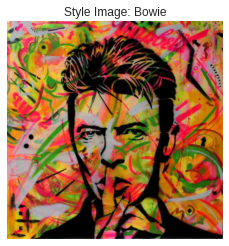

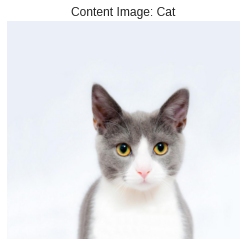

time: 290 ms


In [ ]:
style_img = transform_images(style_image_path)
content_img = transform_images(content_image_path)

display_image(style_img, title='Style Image: Bowie')
display_image(content_img, title='Content Image: Cat')

### Download the pretrained models

VGG19, from Visual Geometry Group, is a CNN with 19 layers. VGG19 can identify up to 1000 classes of objects.

In [ ]:
# here we download and remove the classifier from the end of the model and set the model to eval
VGG = models.vgg19(pretrained=True).features

ResNet50, from He et al. in 2015, is a CNN with 50 layers. ResNet can also identify up to 1000 classes of objects.

In [ ]:
# resnet doesn't allow you to subset the model using '.features' 
RESNET = models.resnet50(pretrained=True)

### Defining content loss

The content loss is the mean squared error between the content image (cat) and the input image fed into the model. This class first must get the feature maps of the content image to be able to calcualte the content distance. 

In [ ]:
class Content_loss(nn.Module):
    '''
    This class is used to create a function that computes the loss between
    the feature maps for the chosen layers of the content image (cat) and the 
    feature maps for the same layers of the image to be stylized.
    '''
    def __init__(self, feature_maps,):
        super(Content_loss, self).__init__()
        # feature maps are returned as a dict from the model wrapper
        # we detach the feature maps from the tree used to compute the gradient
        self.feature_maps = {key: val.detach() for key, val in feature_maps.items()}
        
    def forward(self, input, layer_name):
        return F.mse_loss(input[layer_name], self.feature_maps[layer_name])

###Defining style loss

The style loss is calculated similarly to the content loss, finding the mean square error between the style image (Bowie) and the input image fed into the model. Style loss requires the calculation of a gramian matrix before mse loss. 

A gram matrix is the dot product between the columns of a tensor and the transpose of the columns of the tensor. Gatys et al. proposes using this to compute spatial correlationa and see which spatial features stand out.

In [ ]:
def gram_matrix(input):
    # grab the sizes from input: batch size (1), number of feature maps, dimensions of feature maps
    a, b, c, d = input.size()

    # reshape the input 
    features = input.view(a * b, c * d)

    # comput the gram product
    # perform matrix multiplication between the features and the transpose of the features
    G = torch.mm(features, features.t())  

    # we return a normalized gram matrix by dividing by the total number of elements in the feature maps
    return G.div(a * b * c * d)

In [ ]:
class Style_loss(nn.Module):
    '''
    This class is used to create a function that computes the loss between
    the gram matrix of the feature maps for the chosen layers of the style image (bowie) and the 
    gram matrix of the feature maps for the same layers of the image to be stylized.
    '''
    def __init__(self, feature_maps):
        super(Style_loss, self).__init__()
        # we use the same dict. comprehension as above, but get the gram matrix of the feature maps
        self.feature_maps = {key: gram_matrix(val).detach() for key, val in feature_maps.items()}

    def forward(self, input, layer_name):
        G = gram_matrix(input[layer_name])
        return F.mse_loss(G, self.feature_maps[layer_name])

The content loss and style loss are summed together to form a total loss. Before the summing, each loss is weighted by a user inputted weight parameter. Typically, the style loss weight is magnitudes higher than the content loss weight. Some versions of neural style transfer utilize total variational loss to add spatial smoothness to denoise the output image. TV loss was not attempted here.

###Creating our modified ResNet model

ResNet, compared to VGG, was much harder to iterate through. I think this is due to the sub-modules of bottlenecks in ResNet. Because of this, we are limited to a select number of convolutional layers to get feature maps from. The class below allows us to access the feature maps after any of the 4 ResNet blocks.

In [ ]:
class Resnet_wrapper(nn.Module):
  ''' 
  This class is used to wrap the resnet model. A normalization layer is added with the mean
  and std dev from the dataset ResNet was trained on (Imagenet). After normalization, a batch
  dimension is added to the tensor.

  From my research, it is suggested to use average pooling instead of maxpooling, I will test both.

  Here the four blocks containing the bottlenecks are wrapped into a layer each, labeled conv_#.
  When inputted with a resnet50 model, it outputs a dictionary of layer names and feature maps.

  '''
  def __init__(self, model):
    super(Resnet_wrapper, self).__init__()
    # imagenet mean/std dev:
    self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    self.model = model  
   
  def forward(self, x):
    layers = {}
    x = self.normalize(x)
    # create extra batch dimension and remove any alpha channels if dealing with pngs
    x = self.model.conv1(x.unsqueeze(0)[:, :3, :, :])
    x = self.model.bn1(x)
    x = self.model.relu(x)
    # switch out with avgpool
    x = self.model.maxpool(x)
    #x = self.model.avgpool(x)
    
    # conv blocks:
    x = self.model.layer1(x)
    layers['conv_1'] = x
    x = self.model.layer2(x)
    layers['conv_2'] = x
    x = self.model.layer3(x)
    layers['conv_3'] = x
    x = self.model.layer4(x)
    layers['conv_4'] = x
    
    return layers

###Creating our modified VGG model

Due to the simplicity of VGG19, we are able to iterate through the model's layers and add the layer names and feature maps of the first 13 convolutional layers. This will allow us to experiment with many more layers to find the best layers for style and content representation.

In [ ]:
class VGG_wrapper(nn.Module):
  ''' 
  This class is used to wrap the VGG model. A normalization layer is added with the mean
  and std dev from the dataset VGG was also trained on (Imagenet). After normalization, a batch
  dimension is added to the tensor.
  From my research, it is suggested to use average pooling instead of maxpooling, I will test both.
  When inputted with a vgg19 model, it outputs a dictionary of layer names and feature maps.

  '''
  def __init__(self, model):
    super(VGG_wrapper, self).__init__()
    # imagenet mean/std dev:
    self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    self.model = model

  def forward(self, x):
    layers = {}
    x = self.normalize(x)
    # add batch dim and subset
    x = x.unsqueeze(0)[:, :3, :, :]

    # set a counter to not include last 3 conv layers in model
    i=0
    
    # loop through all layers and add the layers we want to dict layers
    for layer in self.model.children():
      if isinstance(layer, nn.Conv2d):
          i += 1
          name = f'conv_{i}'

      elif isinstance(layer, nn.ReLU):
          name = f'relu_{i}'
          layer = nn.ReLU(inplace=False)

      elif isinstance(layer, nn.MaxPool2d):
          name = f'pool_{i}'
          # replace maxpool with avgpool
          layer = nn.AvgPool2d(kernel_size=2, stride=2)

      elif isinstance(layer, nn.BatchNorm2d):
          name = f'bn_{i}'

      # run tensor through chosen layer
      x = layer(x)
      
      # add the layer name and feature map to our dict
      if isinstance(layer, nn.Conv2d):
        layers[name] = x

      # the last 3 conv layers in the model do not help to add to our content or style
      if i == 13:  
        break

    return layers

### Function to define the optimizer

L-BFGS was used in the original paper due to its ability to converge faster compared to Adam. The downside of L-BFGS, is that it requires a closure function to be passed to recompute the model.

In [ ]:
# learning rate can be set at run time
def optimize(input_img, lr=1):
    optimizer = optim.LBFGS([input_img.requires_grad_()], lr = lr)
    return optimizer

###Function to run the style transfer

In [ ]:
def neural_style_transfer(pretrained_model, content_img, style_img, total_steps, style_weight, content_weight, content_layers, style_layers, lr):
  '''
  This function takes in the user's set parameters, preprocesses the images, gets the feature maps, 
  gets the total loss between feature maps for style and content images and records them, optimizes the weights
  with back prop, every 50th cycle an image is displayed and added to a list for return.
  '''

  # set the modules in the model to evaluation mode
  pretrained_model.eval().cuda()
  
  # tranform images (resize,to_tensor)
  content_img = transform_images(content_img)
  style_img = transform_images(style_img)

  # get the feature maps from the content image
  content_maps = pretrained_model(content_img)
  content_maps = {key: val.detach() for key, val in content_maps.items()}
  
  # get the feature maps from the style image
  style_maps = pretrained_model(style_img)
  style_maps = {key: val.detach() for key, val in style_maps.items()}
  
  # create loss functions to compare feature maps of content/style image to input image
  calc_content_loss = Content_loss(content_maps)
  calc_style_loss = Style_loss(style_maps)
  
  # copy content image (cat) to use as input image
  # other methods involve starting from gaussian noise
  input_img = content_img.clone()

  # send input image and learning rate to optimizer  
  optimizer = optimize(input_img, lr)
  
  # create lists to record outputs
  images = []
  style_losses = []
  content_losses = []

  # set up step counters
  # function inside while loop can access this as a list, but not when an int
  current_step = [0]
  #total_steps = total_steps -1
  
  # loop for number of steps
  while current_step[0] <= total_steps[-1]:
    #print(current_step)

    # closure function needed for optimizer: clear the gradients, compute the loss, and return it
    def return_losses():
      
      # correct the values of updated input image
      input_img.data.clamp_(0, 1)

      # zero gradients of all parameters
      optimizer.zero_grad()

      # get feature maps from input image
      input_maps = pretrained_model(input_img)
      
      # set score values
      style_score = 0
      content_score = 0
      
      # for chosen layers, calculate loss between input image maps and style maps
      for s_loss in style_layers:
          style_score += calc_style_loss(input_maps, s_loss)
          
      # for chosen layers, calculate loss between input image maps and content maps
      for c_loss in content_layers:
          content_score += calc_content_loss(input_maps, c_loss)
      
      # update scores with weights
      style_score *= style_weight
      content_score *= content_weight

      # calc total loss
      loss = style_score + content_score

      # compute gradients
      loss.backward()

      # iterate
      current_step[0] += 1

      # every 50 steps, print output, save metrics
      if current_step[0] % 50 == 0:

          # show the image
          display_image(input_img, title = f'Step {current_step[0]}')

          #print(f'Step{current_step}')
          print('Style Loss : {:.4f} Content Loss: {:.4f}'.format(style_score.item(), content_score.item()))
          print()

          # update lists
          style_losses.append(style_score)
          content_losses.append(content_score)       
          # convert to image, add to list
          unloader = transforms.ToPILImage()  
          image = input_img.clone().cpu()  
          image = image.squeeze(0)      
          image = unloader(image)
          images.append(image)

      return style_score + content_score
    
    # update parameters
    optimizer.step(return_losses)

  # correct the values of updated input image
  input_img.data.clamp_(0, 1)

  return input_img, images, style_losses, content_losses

time: 77 ms


### Run Resnet Style Transfer

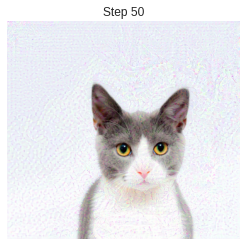

Style Loss : 14.1403 Content Loss: 0.4342



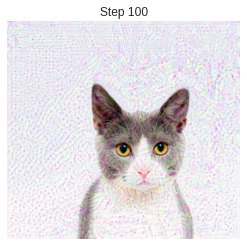

Style Loss : 10.2386 Content Loss: 0.4363



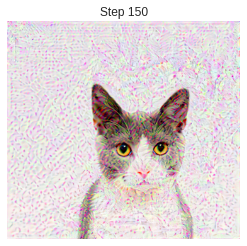

Style Loss : 7.3935 Content Loss: 0.4538



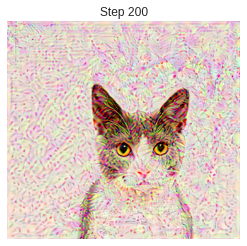

Style Loss : 5.2166 Content Loss: 0.4597



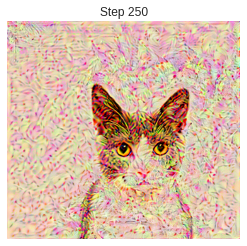

Style Loss : 3.5163 Content Loss: 0.4593



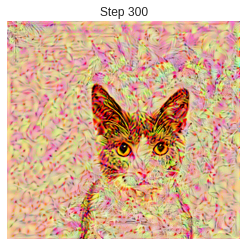

Style Loss : 2.3872 Content Loss: 0.4596



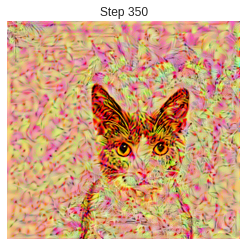

Style Loss : 1.7215 Content Loss: 0.4578



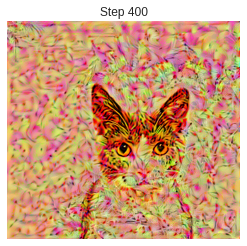

Style Loss : 1.3000 Content Loss: 0.4543



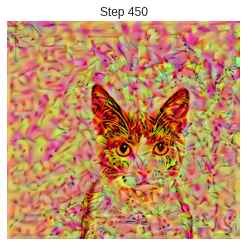

Style Loss : 1.0364 Content Loss: 0.4498



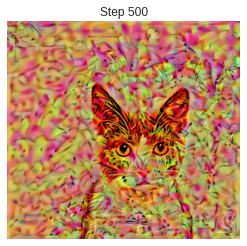

Style Loss : 0.8260 Content Loss: 0.4488



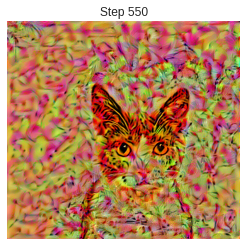

Style Loss : 0.6767 Content Loss: 0.4480



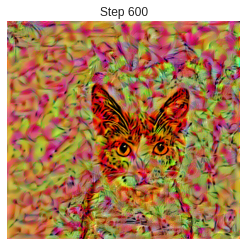

Style Loss : 0.5531 Content Loss: 0.4468



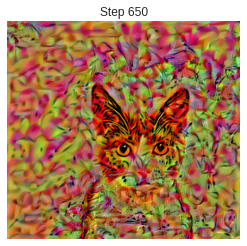

Style Loss : 0.4740 Content Loss: 0.4438



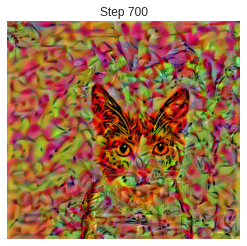

Style Loss : 0.4162 Content Loss: 0.4424



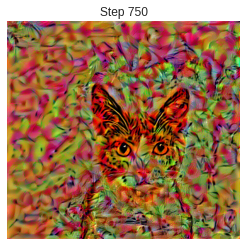

Style Loss : 0.3740 Content Loss: 0.4411



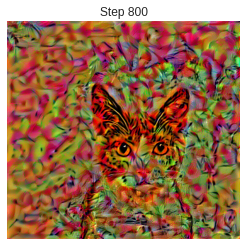

Style Loss : 0.3452 Content Loss: 0.4388



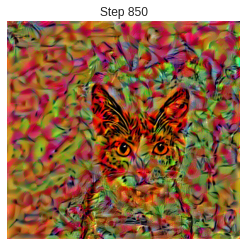

Style Loss : 0.3200 Content Loss: 0.4351

time: 1min 6s


In [ ]:
# set parameters
res_content_weight = 1
res_style_weight = 1e9
res_content_layers = ['conv_3']
res_content_layers2 = ['conv_1']
res_content_layers3 = ['conv_2']
res_content_layers4 = ['conv_4']

res_style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4']
res_LR = 1 # defaults to 1
model_name = RESNET
res_iterations = 850
res_image_name_string = f'bowie_resnet_cl:4_sl:1234_runs:{res_iterations}_cw:{res_style_weight}_sw:{int(res_style_weight)}.jpg'



final_res, res_images, res_style_losses, res_content_losses = neural_style_transfer(Resnet_wrapper(model_name), 
    content_image_path, style_image_path, style_weight = res_style_weight, content_weight = res_content_weight,
    total_steps = range(0, res_iterations), content_layers = res_content_layers4, style_layers = res_style_layers,lr=res_LR)




saving:  bowie_resnet_cl:4_sl:1234_runs:850_cw:1000000000.0_sw:1000000000.jpg


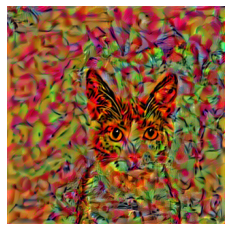

time: 95.3 ms


In [ ]:
unloader = transforms.ToPILImage()  
img_res = final_res.clone().cpu()  
img_res = img_res.squeeze(0)      
img_res = unloader(img_res)

img_res = img_res.resize((320,320))
#img_res.save(res_image_name_string)
print('saving: ', res_image_name_string)
plt.axis('off')
plt.imshow(img_res);

### Run VGG Style Transfer

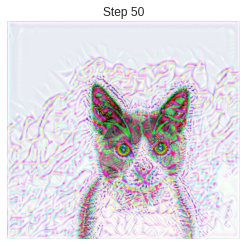

Style Loss : 950.5714 Content Loss: 26.4812



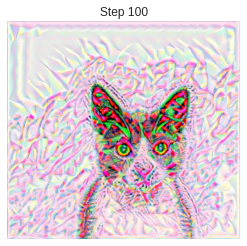

Style Loss : 390.1672 Content Loss: 30.1447



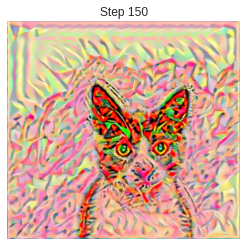

Style Loss : 116.5236 Content Loss: 31.4114



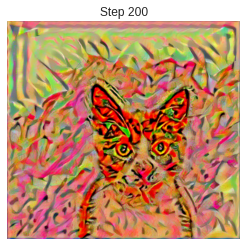

Style Loss : 22.7334 Content Loss: 30.6863



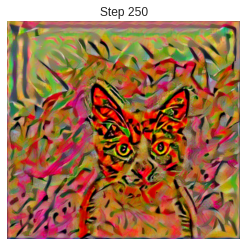

Style Loss : 7.4317 Content Loss: 29.7403



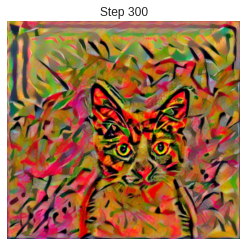

Style Loss : 4.9202 Content Loss: 28.4392



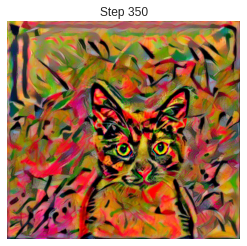

Style Loss : 3.7281 Content Loss: 27.9643



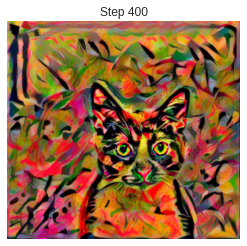

Style Loss : 2.9616 Content Loss: 27.6549



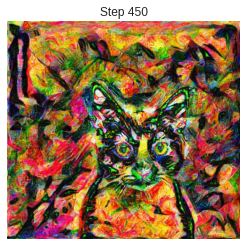

Style Loss : 883.3080 Content Loss: 39.6462



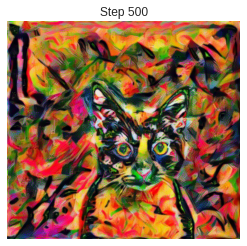

Style Loss : 6.9939 Content Loss: 30.7209



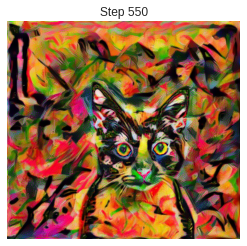

Style Loss : 2.4852 Content Loss: 28.5415



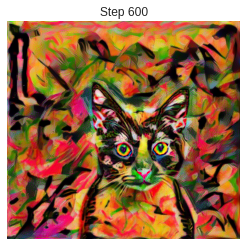

Style Loss : 1.8366 Content Loss: 27.0026



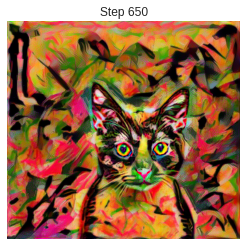

Style Loss : 1.6095 Content Loss: 26.2234



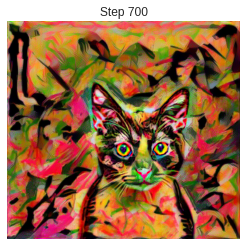

Style Loss : 1.6294 Content Loss: 25.9229



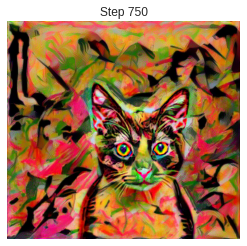

Style Loss : 1.8527 Content Loss: 25.6736



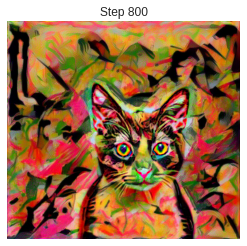

Style Loss : 5.1310 Content Loss: 25.4198



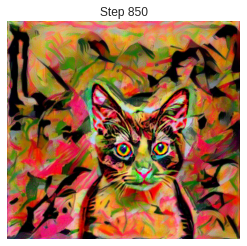

Style Loss : 3.9584 Content Loss: 25.7192



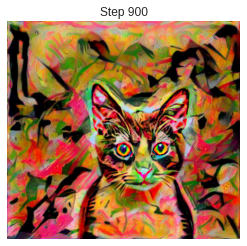

Style Loss : 1.9038 Content Loss: 26.2570



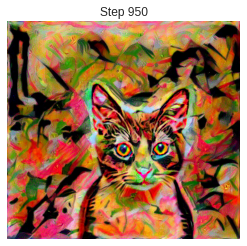

Style Loss : 15.2511 Content Loss: 27.1446



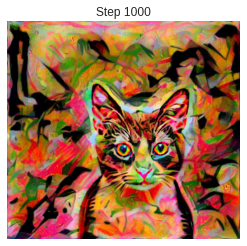

Style Loss : 12.3179 Content Loss: 26.1275



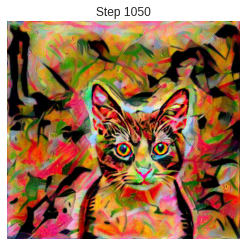

Style Loss : 19.5900 Content Loss: 26.4270



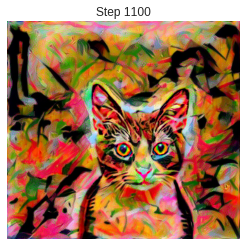

Style Loss : 2.8692 Content Loss: 26.0233



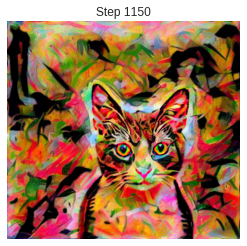

Style Loss : 9.6582 Content Loss: 26.7267



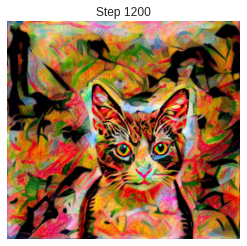

Style Loss : 43.9044 Content Loss: 27.9365

time: 1min 50s


In [ ]:
vgg_content_weight = 1
vgg_style_weight = 1e6
vgg_content_layers = ['conv_10'] 
vgg_content_layers2 = ['conv_4']

vgg_style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_9', 'conv_13'] 
vgg_style_layers2 = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5'] 
vgg_style_layers3 = ['conv_1', 'conv_3', 'conv_5', 'conv_7', 'conv_8'] 
vgg_style_layers4 = ['conv_1', 'conv_2', 'conv_3', 'conv_4'] 


vgg_LR = .1 # defaults to 1
model_name = VGG
vgg_iterations = 1200
vgg_image_name_string = f'bowie_vgg_cl:4_sl:135913_runs:{vgg_iterations}_cw:{vgg_content_weight}_sw:{int(vgg_style_weight)}.jpg'



final_vgg, vgg_images, vgg_style_losses, vgg_content_losses = neural_style_transfer(VGG_wrapper(model_name), 
content_image_path, style_image_path, style_weight=vgg_style_weight, content_weight=vgg_content_weight,
total_steps = range(0, vgg_iterations), content_layers = vgg_content_layers2, style_layers = vgg_style_layers, lr=vgg_LR)


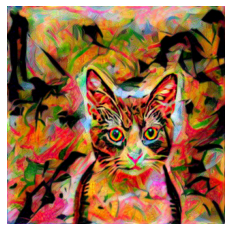

time: 95.7 ms


In [ ]:
unloader = transforms.ToPILImage()  
img_vgg = final_vgg.clone().cpu()  
img_vgg = img_vgg.squeeze(0)      
img_vgg = unloader(img_vgg)

img_vgg = img_vgg.resize((320,320))
img_vgg.save(vgg_image_name_string)
plt.axis('off')

plt.imshow(img_vgg);

###Comparing losses

In [ ]:
def plot_losses(res_style_loss, res_content_loss, vgg_style_loss, vgg_content_loss):
  plt.figure(figsize=(16,4))
  # Initialize the figure
  plt.style.use('seaborn-darkgrid')
 
  # create a color palette
  palette = plt.get_cmap('Set1')

  res_style_loss = np.array(res_style_loss, dtype=np.float32)
  res_content_loss = np.array(res_content_loss, dtype=np.float32)

  vgg_style_loss = np.array(vgg_style_loss, dtype=np.float32)
  vgg_content_loss = np.array(vgg_content_loss, dtype=np.float32)

  plt.subplot(141)
  plt.plot(range(0,len(res_style_loss)), res_style_loss, color=palette(2))
  plt.xlabel('Steps')
  plt.ylabel('Loss')
  plt.title('Resnet Style Loss')

  plt.subplot(142)
  plt.plot(range(0,len(vgg_style_loss)), vgg_style_loss, color=palette(2))
  plt.xlabel('Steps')
  plt.ylabel('Loss')
  plt.title('VGG Style Loss')

  plt.subplot(143)
  plt.plot(range(0,len(res_content_loss)), res_content_loss, color=palette(3))
  plt.xlabel('Steps')
  plt.ylabel('Loss')
  plt.title('Resnet Content Loss')

  plt.subplot(144)
  plt.plot(range(0,len(vgg_content_loss)), vgg_content_loss, color=palette(3))
  plt.xlabel('Steps')
  plt.ylabel('Loss')
  plt.title('VGG Content Loss')

time: 16.7 ms


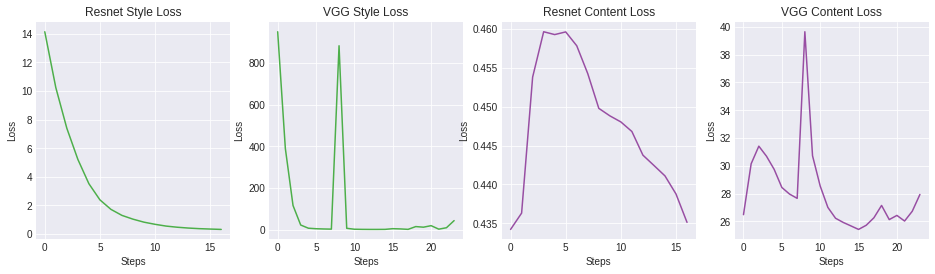

time: 463 ms


In [ ]:
plot_losses(res_style_losses, res_content_losses, vgg_style_losses, vgg_content_losses)

**Note:** Actual loss values are dependent on the weights used in each style transfer run. So, it is best not to compare absolute loss values, but the slopes of the loss curves. Also, content loss starts at zero because we use the content images as the input image.

As you can see from above, VGG style loss converges much quicker compared to ResNet, although it has an issue somewhere around step 8. Resnet does a better job with content loss. 

In [ ]:
def compare_images(style_image, style_title, content_image, content_title, result_image, result_title):
    
  plt.figure(figsize=(10,10))
  plt.figure(1)
  plt.axis('off')
  sb1 = plt.subplot(131)

  sb1.imshow(style_image)
  sb1.set_title(style_title)
  sb1.axis('off')

  plt.figure(1)
  plt.axis('off')
  sb1 = plt.subplot(132)
  sb1.imshow(content_image)
  sb1.set_title(content_title)
  sb1.axis('off')

  # if tensor:
  if type(result_image) == torch.Tensor:
    unloader = transforms.ToPILImage()  
    img = result_image.clone().cpu()  
    img = img.squeeze(0)      
    img = unloader(img)

    sb2 = plt.subplot(133)
    sb2.imshow(img)
    sb2.axis('off')
    sb2.set_title(result_title)
  # if image
  else:
    sb2 = plt.subplot(133)
    sb2.imshow(result_image)
    sb2.axis('off')
    sb2.set_title(result_title)
    plt.show()

time: 13.1 ms


In [ ]:
def compare_images2(style_image, style_title, content_image, content_title, result_image, result_title, bowie_image, bowie_title):
    
  plt.figure(figsize=(15,15))

  sb1 = plt.subplot(141)
  sb1.imshow(style_image)
  sb1.set_title(style_title)
  sb1.axis('off')

  sb2 = plt.subplot(142)
  sb2.imshow(content_image)
  sb2.set_title(content_title)
  sb2.axis('off')

  # if tensor:
  if type(result_image) == torch.Tensor:
    unloader = transforms.ToPILImage()  
    img = result_image.clone().cpu()  
    img = img.squeeze(0)      
    img = unloader(img)

    sb4 = plt.subplot(143)
    sb4.imshow(img)
    sb4.axis('off')
    sb4.set_title(result_title)
  # if image
  else:
    sb4 = plt.subplot(143)
    sb4.imshow(result_image)
    sb4.axis('off')
    sb4.set_title(result_title)
    

  sb3 = plt.subplot(144)
  sb3.imshow(bowie_image)
  sb3.set_title(bowie_title)
  sb3.axis('off')

  plt.show()

time: 19 ms


###Compare Best Results

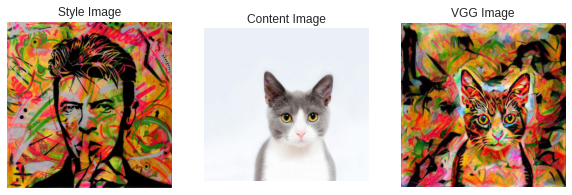

time: 338 ms


In [ ]:
compare_images(style_image, 'Style Image', content_image, "Content Image", vgg3, 'VGG Image')

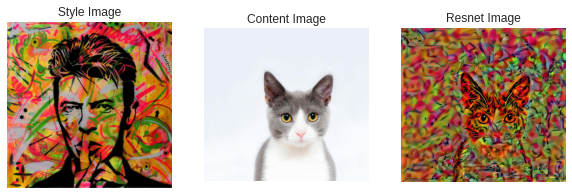

time: 352 ms


In [ ]:
compare_images(style_image, 'Style Image', content_image, "Content Image", final_res, 'Resnet Image')

As you can see above, VGG does a better job at recreating the style. 

In [ ]:
#ref: https://stackoverflow.com/questions/2584232/zoom-image-to-pixel-level
def naivezoom(img, px, py, zf, bg):
    out = Image.new(img.mode, img.size)        
    pix = out.load()
    iw, ih = img.size
    for x in range(iw):
        for y in range(ih):
            xorg = x + zf*(px - x)
            yorg = y + zf*(py - y)
            if xorg >= 0 and xorg < iw and yorg >= 0 and yorg < ih:
                pix[x,y] = img.getpixel( (xorg , yorg) )
            else:
                pix[x,y] = bg
    return out

time: 3.86 ms


###Compare Content Features

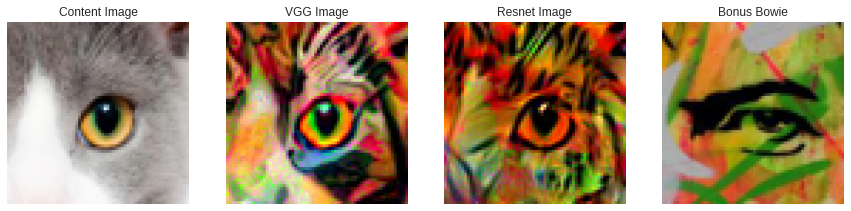

time: 602 ms


In [ ]:
# compare eyes
ci_zoom = naivezoom(content_image_resized, 220, 190, .80, 255)
vgg_zoom = naivezoom(img_vgg, 220, 190, .80, 255)
res_zoom = naivezoom(img_res, 220, 190, .80, 255)
bowie_zoom = naivezoom(style_image_resized, 190, 160, .80, 255)
compare_images2(ci_zoom,'Content Image', vgg_zoom, 'VGG Image', res_zoom, 'Resnet Image', bowie_zoom,'Bonus Bowie')

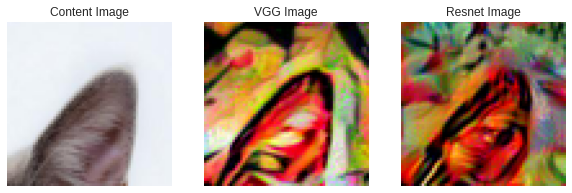

time: 450 ms


In [ ]:
# compare ears
ci_zoom = naivezoom(content_image_resized, 250, 100, .80, 255)
vgg_zoom = naivezoom(img_vgg, 250, 100, .80, 255)
res_zoom = naivezoom(img_res, 250, 100, .80, 255)
compare_images(ci_zoom,'Content Image', vgg_zoom, 'VGG Image', res_zoom, 'Resnet Image')

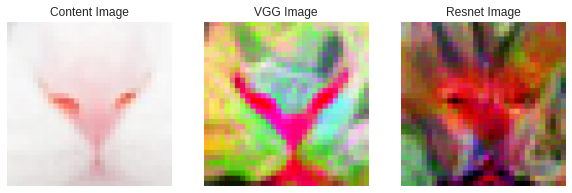

time: 444 ms


In [ ]:
# compare noses
ci_zoom = naivezoom(content_image_resized, 190, 230, .90, 255)
vgg_zoom = naivezoom(img_vgg, 190, 230, .90, 255)
res_zoom = naivezoom(img_res, 190, 230, .90, 255)
compare_images(ci_zoom,'Content Image', vgg_zoom, 'VGG Image', res_zoom, 'Resnet Image')

###Compare Style Features

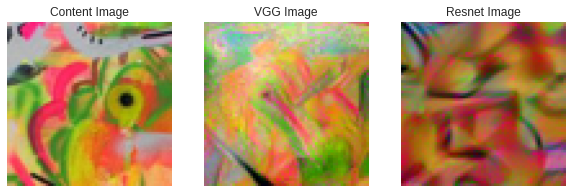

time: 477 ms


In [ ]:
# compare styles
si_zoom = naivezoom(style_image_resized, 10, 10, .80, 255)
vgg_zoom = naivezoom(img_vgg, 45, 10, .80, 255)
res_zoom = naivezoom(img_res, 45, 10, .80, 255)

compare_images(si_zoom,'Content Image', vgg_zoom, 'VGG Image', res_zoom, 'Resnet Image')

###Comparison of different parameters  
No matter what I set the ResNet parameters to, it seems to always return a similiar result with the content washed out and overpowerd by the style. Here are 3 different outputs from VGG and 1 from ResNet.

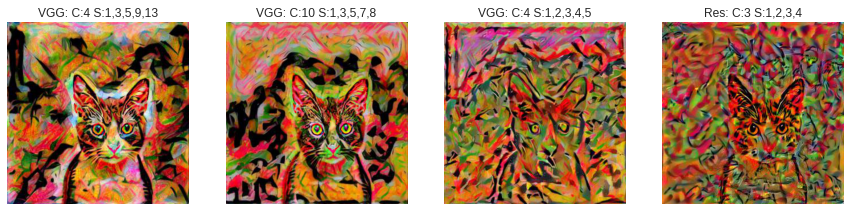

time: 283 ms


In [ ]:
res1 = Image.open('/content/bowie_resnet_cl:3_sl:1234_runs:1200_cw:1000000000000.0_sw:1000000000000.jpg')
vgg1 = Image.open('/content/bowie_vgg_cl:4_sl:12345_runs:1200_cw:1_sw:1000000.jpg')
vgg2 = Image.open('/content/bowie_vgg_cl:10_sl:13578_runs:1200_cw:1_sw:1000000.jpg')
vgg3 = Image.open('/content/bowie_vgg_cl:4_sl:135913_runs:1200_cw:1_sw:1000000.jpg')

compare_images2(vgg3, 'VGG: C:4 S:1,3,5,9,13', vgg1,'VGG: C:10 S:1,3,5,7,8', vgg2, 'VGG: C:4 S:1,2,3,4,5',  res1, 'Res: C:3 S:1,2,3,4')

###Discussion:

VGG outperformed ResNet in style a lot and in content by a little. Both models executed in about the same time, although VGG required much fewer steps to converge to an acceptable image. VGG has many more parameters compared to ResNet, this could explain why it is able to pick up on style and content features more easily. ResNet might have better convolutional layers for this task, but they could be wrapped up in the block layers that I was not able to access directly. Another possible explanation could be the lack of batchnorm in VGG, compared to most other models. I did not do an exhaustive grid search of input parameters, so in some configuration, ResNet might get better results.



#Gif Time

In [ ]:
def make_gif(list_of_images, name):
  list_of_images_copy = copy.deepcopy(list_of_images)
  [item.convert('RGB') for item in list_of_images_copy];
  list_of_images_copy = [item.resize((200,200)) for item in list_of_images_copy];
  list_of_images_copy[0].save(f'{name}.gif', save_all=True, append_images=list_of_images_copy, loop=0, duration=500)
  Image2(open(f'/content/{name}.gif','rb').read())

time: 3.78 ms


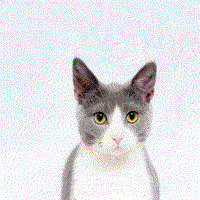

time: 130 ms


In [ ]:
make_gif(res_images, 'res_gif')
Image2(open(f'/content/res_gif.gif','rb').read())

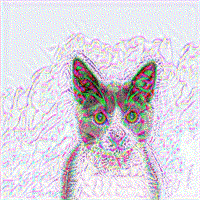

time: 187 ms


In [ ]:
make_gif(vgg_images, 'vgg_gif')
Image2(open(f'/content/vgg_gif.gif','rb').read())

### Trying out other styles

In [ ]:
r3 = requests.get('https://free4kwallpapers.com/uploads/originals/2017/06/03/lily-pad-wallpaper.jpg')
r4 = requests.get('https://upload.wikimedia.org/wikipedia/commons/b/b2/Vincent_van_Gogh_-_Self-Portrait_-_Google_Art_Project.jpg')
r5 = requests.get('https://miro.medium.com/max/776/0*4IeSxDaDdYZtzmZy.')
r6 = requests.get('https://d2hhj3gz5jljkm.cloudfront.net/wallpapers2/083/425/088/000/original/file.jpg')

lilypad = Image.open(BytesIO(r3.content)).resize((320,320))
lilypad.save('lilypad.jpg')

gogh = Image.open(BytesIO(r4.content)).resize((320,320))
gogh.save('gogh.jpg')

scream = Image.open(BytesIO(r5.content)).resize((320,320))
scream.save('scream.jpg')

dancer = Image.open(BytesIO(r6.content)).resize((320,320))
dancer.save('dancer.jpg')

In [ ]:
vgg_content_weight = 1
vgg_style_weight = 1e6
vgg_content_layers = ['conv_10'] 
vgg_style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_9', 'conv_13'] 
vgg_LR = 1 # defaults to 1
model_name = VGG
vgg_iterations = 1200
vgg_image_name_string = 'gogh_cat.jpg'

style_image_path = '/content/gogh.jpg'

final_vgg2, vgg_images2, vgg_style_losses22, vgg_content_losses = neural_style_transfer(VGG_wrapper(model_name), 
content_image_path, style_image_path, style_weight=vgg_style_weight, content_weight=vgg_content_weight,
total_steps = range(0, vgg_iterations), content_layers = vgg_content_layers, style_layers = vgg_style_layers, lr=vgg_LR)


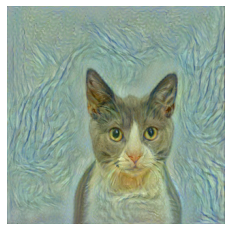

time: 102 ms


In [ ]:
unloader = transforms.ToPILImage()  
img_vgg2 = final_vgg2.clone().cpu()  
img_vgg2 = img_vgg2.squeeze(0)      
img_vgg2 = unloader(img_vgg2)

img_vgg2 = img_vgg2.resize((320,320))
img_vgg2.save(vgg_image_name_string)
plt.axis('off')

plt.imshow(img_vgg2);

In [ ]:
vgg_content_weight = 1
vgg_style_weight = 1e6
vgg_content_layers = ['conv_10'] 
vgg_style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_9', 'conv_13'] 
vgg_LR = 1 # defaults to 1
model_name = VGG
vgg_iterations = 1200
vgg_image_name_string = 'dancer_cat.jpg'

style_image_path = '/content/dancer.jpg'

final_vgg3, vgg_images3, vgg_style_losses3, vgg_content_losses3 = neural_style_transfer(VGG_wrapper(model_name), 
content_image_path, style_image_path, style_weight=vgg_style_weight, content_weight=vgg_content_weight,
total_steps = range(0, vgg_iterations), content_layers = vgg_content_layers, style_layers = vgg_style_layers, lr=vgg_LR)


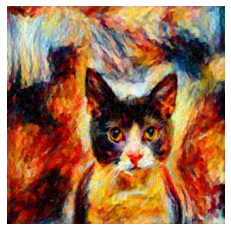

time: 100 ms


In [ ]:
unloader = transforms.ToPILImage()  
img_vgg3 = final_vgg3.clone().cpu()  
img_vgg3 = img_vgg3.squeeze(0)      
img_vgg3 = unloader(img_vgg3)

img_vgg3 = img_vgg3.resize((320,320))
img_vgg3.save(vgg_image_name_string)
plt.axis('off')

plt.imshow(img_vgg3);

In [ ]:
vgg_content_weight = 1
vgg_style_weight = 1e6
vgg_content_layers = ['conv_10'] 
vgg_style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_9', 'conv_13'] 
vgg_LR = 1 # defaults to 1
model_name = VGG
vgg_iterations = 1200
vgg_image_name_string = 'lilypad_cat.jpg'

style_image_path = '/content/lilypad.jpg'

final_vgg4, vgg_images4, vgg_style_losses4, vgg_content_losses4 = neural_style_transfer(VGG_wrapper(model_name), 
content_image_path, style_image_path, style_weight=vgg_style_weight, content_weight=vgg_content_weight,
total_steps = range(0, vgg_iterations), content_layers = vgg_content_layers, style_layers = vgg_style_layers, lr=vgg_LR)


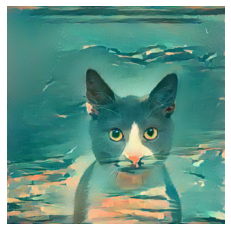

time: 114 ms


In [ ]:
unloader = transforms.ToPILImage()  
img_vgg4 = final_vgg4.clone().cpu()  
img_vgg4 = img_vgg4.squeeze(0)      
img_vgg4 = unloader(img_vgg4)

img_vgg4 = vgg_images4[-2].resize((320,320))
img_vgg4.save(vgg_image_name_string)
plt.axis('off')

plt.imshow(img_vgg4);

In [ ]:
vgg_content_weight = 1
vgg_style_weight = 1e6
vgg_content_layers = ['conv_10'] 
vgg_style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_9', 'conv_13'] 
vgg_LR = 1 # defaults to 1
model_name = VGG
vgg_iterations = 1200
vgg_image_name_string = 'scream_cat.jpg'

style_image_path = '/content/scream.jpg'

final_vgg5, vgg_images5, vgg_style_losses5, vgg_content_losses5 = neural_style_transfer(VGG_wrapper(model_name), 
content_image_path, style_image_path, style_weight=vgg_style_weight, content_weight=vgg_content_weight,
total_steps = range(0, vgg_iterations), content_layers = vgg_content_layers, style_layers = vgg_style_layers, lr=vgg_LR)


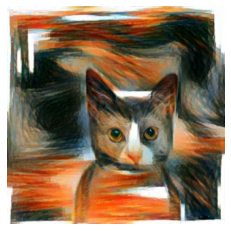

time: 98.2 ms


In [ ]:
unloader = transforms.ToPILImage()  
img_vgg5 = final_vgg5.clone().cpu()  
img_vgg5 = img_vgg5.squeeze(0)      
img_vgg5 = unloader(img_vgg5)

img_vgg5 = vgg_images5[-5].resize((320,320))
img_vgg5.save(vgg_image_name_string)
plt.axis('off')

plt.imshow(img_vgg5);

# A collection of cats

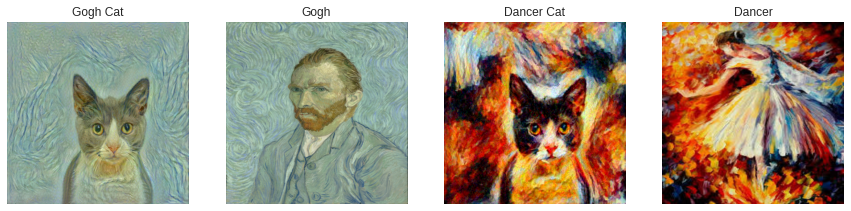

time: 219 ms


In [ ]:
compare_images2(img_vgg2, 'Gogh Cat', gogh,'Gogh', img_vgg3, 'Dancer Cat',  dancer, 'Dancer')

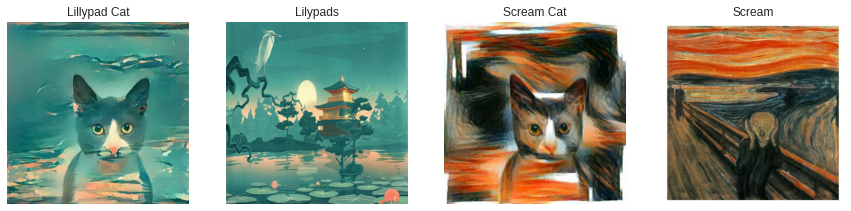

time: 296 ms


In [ ]:
compare_images2(img_vgg4, 'Lillypad Cat', lilypad,'Lilypads', img_vgg5, 'Scream Cat',  scream, 'Scream')

#References  
- Zooming into image: https://stackoverflow.com/questions/2584232/zoom-image-to-pixel-level    
  
- Saving to gif: https://stackoverflow.com/questions/24688802/saving-an-animated-gif-in-pillow  
  
- Displaying gif: https://stackoverflow.com/questions/61110188/how-to-display-a-gif-in-jupyter-notebook-using-google-colab  
  
- VGG Style Trasnfer: https://pytorch.org/tutorials/advanced/neural_style_tutorial.html?highlight=neural%20transfer
  
- Resnet Style Trasnfer:   
https://reiinakano.com/2019/06/21/robust-neural-style-transfer.html  
https://github.com/Leo8216/Neural-Style-Transfer-using-ResNet50-with-tf.keras-